In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from itertools import combinations

from scipy.stats import pearsonr
from scipy.stats import stats
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
import statsmodels.api as sm
from statsmodels.formula.api import ols

from bin import load_bgi as ld
from sklearn.linear_model import ElasticNet, LinearRegression
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import gseapy as gp
import shap
from scipy.stats import f_oneway

In [2]:
fdata = ad.read_h5ad("./RNA/Multitime_sorted.h5")
cdata = ad.read_h5ad("./RNA/Multitime.fixed.guide.h5")

In [3]:
new_data = ad.read_h5ad("./gRNA/B924/new.h5")

In [37]:
new_data.obs["time_point"] = "1"

In [54]:
new_data

AnnData object with n_obs × n_vars = 20596 × 34
    obs: 's_index', 'time_point'
    obsm: 'spatial'

In [50]:
cdata_1 = cdata[cdata.obs["time_point"] == "1"]
cdata_23 = cdata[cdata.obs["time_point"] != "1"]

In [57]:
g_cells = [tuple(array) for array in new_data.obsm['spatial']]
t_cells = [tuple(array) for array in cdata_1.obsm['spatial']]
cells_to_keep = [True if cell in t_cells else False for cell in g_cells]

cdata_1_new = new_data[cells_to_keep, :].copy()

In [58]:
cdata_1_new

AnnData object with n_obs × n_vars = 20587 × 34
    obs: 's_index', 'time_point'
    obsm: 'spatial'

In [59]:
cdata_new = ad.concat([cdata_1_new, cdata_23])
cdata_new.obs_names_make_unique()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [60]:
cdata_new

AnnData object with n_obs × n_vars = 66509 × 34
    obs: 'time_point'
    obsm: 'spatial'

In [66]:
cdata_new.obsm["spatial_cov"]

array([['1_6700', '1_500'],
       ['1_600', '1_1000'],
       ['1_8800', '1_1600'],
       ...,
       ['3_9900', '3_9700'],
       ['3_9900', '3_9800'],
       ['3_9900', '3_9900']], dtype='<U7')

In [67]:
cdata_new.obsm["spatial_cov"] = np.array([batch + "_" + f"{array[0]}" + "," + batch + "_" + f"{array[1]}" for batch, array in zip(cdata_new.obs["time_point"], cdata_new.obsm['spatial'])])
sorted_indices = sorted(enumerate(cdata_new.obsm["spatial_cov"]), key=lambda x: x[1])
indexes = [orig_idx for orig_idx, _ in sorted_indices]
sorted_cdata = cdata_new[indexes, :].copy()

In [69]:
sorted_cdata.write_h5ad("./RNA/Multitime.fixed.guide.h5")

# Clusterization

To Determine the "ENVIRONMENTS"

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


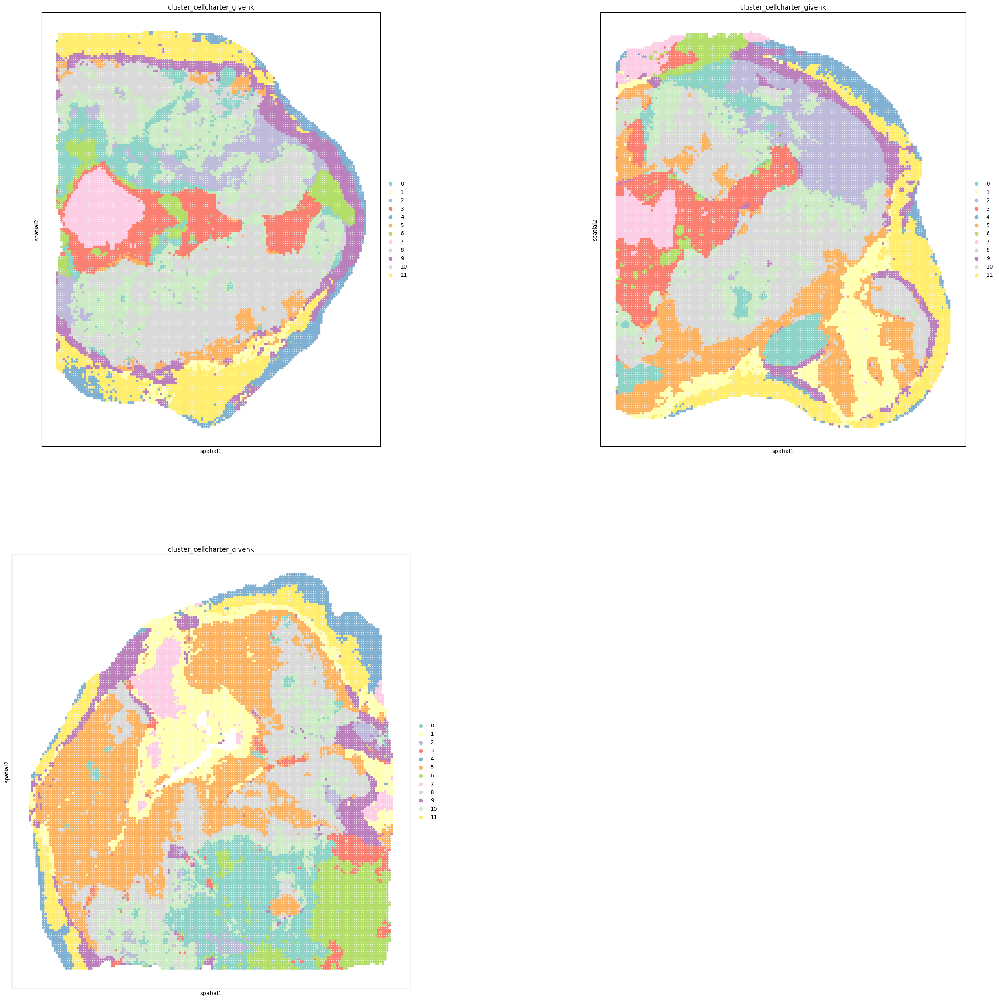

In [5]:
sq.pl.spatial_scatter(
    fdata, 
    color=['cluster_cellcharter_givenk'], 
    library_key='time_point',  
    size=50, 
    img=None,
    spatial_key='spatial',
    palette='Set3',
    figsize=(15,15),
    ncols=2,
    shape=None
)

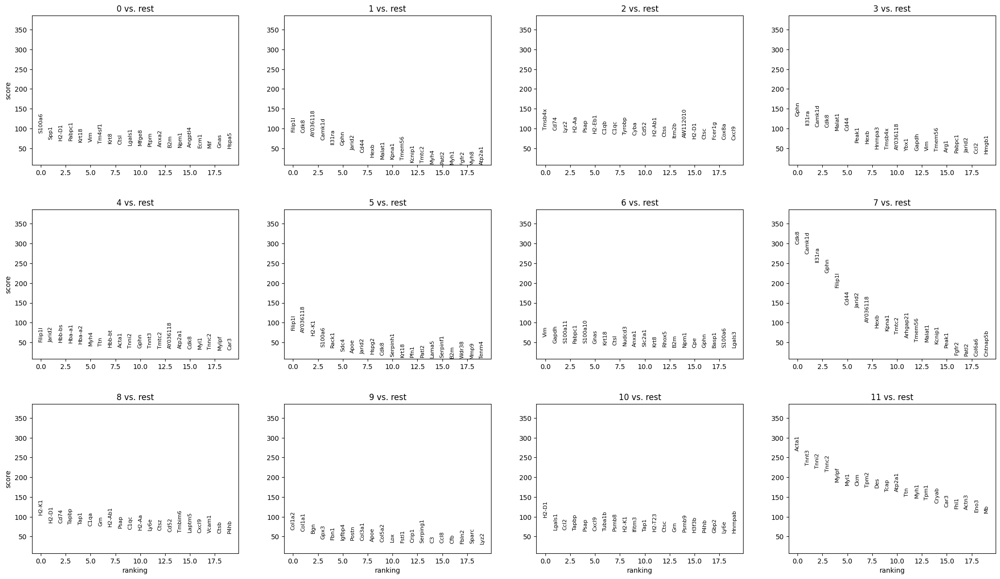

In [6]:
sc.tl.rank_genes_groups(fdata, groupby="cluster_cellcharter_givenk", method="t-test")
sc.pl.rank_genes_groups(fdata, n_genes=20)

1) Cluster 0, Hypoxia Epithelial
2) Cluster 1, Hypoxia and Arginine metabolism
3) Cluster 2, Mmp9 (Unspecific)
4) Cluster 3, Hypoxia Epithelial
5) Cluster 4, Fibroblasts
6) Cluster 5, Macro / T
7) Cluster 6, HA
8) Cluster 7, Hypoxia / EMT
9) Cluster 8, Hypoxia
10) Cluster 9, DC / Macrophage
11) Cluster 10, Myofibril
12) Cluster 11, Cxcl12+ Fibroblasts
13) Cluster 12, EMT

In [1]:
fdata[:, "Myh7"]

NameError: name 'fdata' is not defined

In [10]:
pval_cutoff = 0.01
top_n = 200

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names  # 获取所有聚类的名字

# 创建一个空的DataFrame用来存储结果
top_genes_df = pd.DataFrame()

for group in groups:
    # 提取每个聚类的基因名称、Log2FC、padj
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    # 将它们转换为DataFrame
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score
    })
    
    # 筛选出padj > 0.01的基因
    filtered_data = data[data['padj'] < 0.01]
    
    # 按Log2FoldChange降序排序
    sorted_data = filtered_data.sort_values(by='score', ascending=False)
    
    # 选取排序前10的基因
    top_genes = sorted_data.head(top_n)
    
    # 添加聚类信息
    top_genes['Cluster'] = group
    
    # 将当前聚类的结果追加到总的DataFrame中
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('DEG.csv', index=False, sep="\t")
top_genes_df

/tmp/ipykernel_61762/438216177.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_genes['Cluster'] = group
/tmp/ipykernel_61762/438216177.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_genes['Cluster'] = group
/tmp/ipykernel_61762/438216177.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

,Gene,Log2FoldChange,padj,score,Cluster
0,S100a6,0.705705,0.000000e+00,88.272202,0
1,Spp1,1.079456,0.000000e+00,72.598366,0
2,H2-D1,0.454569,0.000000e+00,69.911057,0
3,Pabpc1,0.957705,0.000000e+00,69.342979,0
4,Krt18,1.343269,0.000000e+00,66.212166,0
...,...,...,...,...,...
2395,Fbxo40,2.596166,1.327033e-204,31.928143,11
2396,Mypn,3.168517,5.778296e-204,31.884069,11
2397,Fxyd6,2.392966,5.432835e-204,31.865702,11
2398,Tuba8,3.184758,2.712428e-203,31.830925,11


In [24]:
for i in range(12):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Combined Score"] > 100]
    results[["Name", "ID"]] = results["Term"].str.extract(r'(.+?) \((GO:\d+)\)')
    results = results.iloc[:, [-1, -2, -3, -4]]
    # results["Name"] = results["Term"]
    # results = results.iloc[:, [-1, -2, -3]]
    results["Cluster"] = i
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
go_df[go_df["Cluster"] == 5]

,ID,Name,Genes,Combined Score,Cluster
10,GO:0007158,Neuron Cell-Cell Adhesion,NRXN3;NRXN2;ASTN2,219.569955,5
23,GO:1900272,Negative Regulation Of Long-Term Synaptic Pote...,APOE;PTN,197.365903,5
2,GO:0007215,Glutamate Receptor Signaling Pathway,GRIN2A;GRID2;GRM4;GRIK4;GRIN2B,179.610442,5
3,GO:0099565,"Chemical Synaptic Transmission, Postsynaptic",GLRA1;GRIN2A;GRID2;GRIN2B,176.262307,5
25,GO:0046486,Glycerolipid Metabolic Process,DGKG;DGKB,162.172559,5
0,GO:0098742,Cell-Cell Adhesion Via Plasma-Membrane Adhesio...,KIRREL3;TENM2;GRID2;PTPRS;TENM4;CDH5;CDH4;CDH2...,152.417844,5
8,GO:0098815,Modulation Of Excitatory Postsynaptic Potential,GRIN2A;CUX2;CHRNA7;GRIN2B,124.133566,5
7,GO:1900271,Regulation Of Long-Term Synaptic Potentiation,CHRNA7;PTN;APOE;EPHB2,124.133566,5
18,GO:0060291,Long-Term Synaptic Potentiation,SLC24A2;GRIN2A;GRIN2B,122.583777,5
11,GO:0048168,Regulation Of Neuronal Synaptic Plasticity,GRIN2A;APOE;EPHB2;GRIN2B,106.801264,5


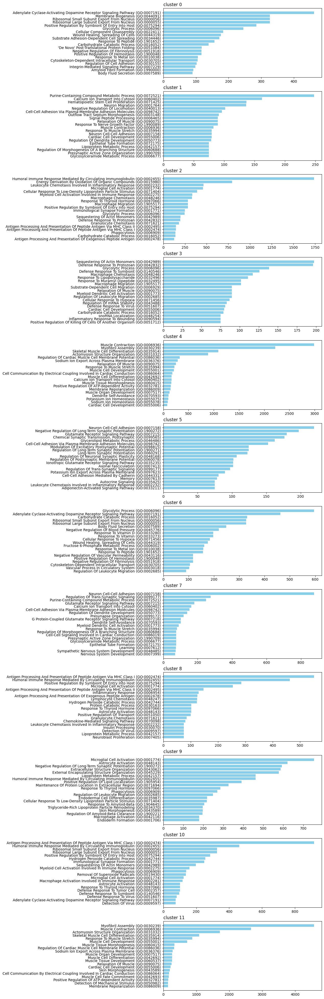

In [13]:
fig = plt.figure(figsize=(8, 50))
for i in range(12):
    ax = plt.subplot(12, 1, i+1)
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(20)  # Select top 10 results for visualization

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.title(f"cluster {i}", loc="left")
    plt.gca().invert_yaxis()  # Invert y-axis to have the highest score on top

# Guide Distribution

Determine which guide has specificity to a certain environment

In [3]:
# proportion matrix for each gene and cluster
cdata.obs["cluster_cellcharter_givenk"] = fdata.obs["cluster_cellcharter_givenk"].tolist()
guide_cluster_counts = pd.DataFrame(cdata.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata.obs["cluster_cellcharter_givenk"].tolist()

guide_total_counts = guide_cluster_counts.sum(axis=0)[:-1]
guide_cluster_proportions = guide_cluster_counts.groupby(["cluster"]).sum()
guide_cluster_proportions = guide_cluster_proportions.div(guide_total_counts, axis=1)
guide_cluster_proportions.index = guide_cluster_proportions.index.astype(int)
guide_cluster_proportions = guide_cluster_proportions.T.reindex(sorted(guide_cluster_proportions.index), axis=1)
for i in range(12): guide_cluster_proportions[i] = guide_cluster_proportions.convert_dtypes().loc[:, i].astype(float).to_list()
ntc_guide_counts = guide_cluster_proportions.iloc[-1]
guide_cluster_proportions = guide_cluster_proportions - ntc_guide_counts

In [4]:
total_bins = fdata.obs_names.shape[0]
bin_cluster_proportions = pd.DataFrame(fdata.obs["cluster_cellcharter_givenk"].value_counts())
bin_cluster_proportions = bin_cluster_proportions.T.reindex(sorted(bin_cluster_proportions.index), axis=1)
bin_cluster_proportions = bin_cluster_proportions / total_bins
bin_cluster_proportions

cluster_cellcharter_givenk,0,1,2,3,4,5,6,7,8,9,10,11
count,0.078621,0.071389,0.053872,0.067525,0.039995,0.150927,0.045618,0.03786,0.189268,0.062758,0.117653,0.084515


In [15]:
def p_value_to_significance(p_value):
    if p_value < 0.0001:
        return "****"
    elif p_value < 0.001:
        return "***"
    elif p_value < 0.01:
        return "**"
    elif p_value < 0.05:
        return "*"
    else:
        return "ns"
p_df = np.zeros((len(np.unique(fdata.obs["cluster_cellcharter_givenk"])), 33))
for ic in np.unique(fdata.obs["cluster_cellcharter_givenk"]):
    ntc_cnt_vec = cdata[fdata.obs["cluster_cellcharter_givenk"] == ic, "sgnon-targeting"].X.toarray().flatten()
    ntc_cnt_vec = ntc_cnt_vec / np.sum(cdata[:, "sgnon-targeting"].X)
    for ig, guide in enumerate(cdata.var_names[:-1]):
        guide_cnt_vec = cdata[fdata.obs["cluster_cellcharter_givenk"] == ic, guide].X.toarray().flatten()
        guide_cnt_vec = guide_cnt_vec / np.sum(cdata[:, guide].X)
        f_statistic, p_value = f_oneway(ntc_cnt_vec, guide_cnt_vec)
        p_df[ic, ig] = p_value
p_df = pd.DataFrame(p_df)
p_df = pd.concat([p_df, pd.DataFrame(np.ones((12, 1)))], axis=1).T
#p_df = p_df.applymap(p_value_to_significance)
p_df.columns = np.unique(fdata.obs["cluster_cellcharter_givenk"])
p_df.index = cdata.var_names
p_df

,0,1,2,3,4,5,6,7,8,9,10,11
sgAdrb2,0.652166,0.015444,0.651836,0.805980,0.582951,0.011131,0.043086,0.416032,0.007534,0.300892,0.233494,0.034272
sgAqp3,0.688339,0.536451,0.228018,0.813000,0.599522,0.333671,0.087109,0.546829,0.413537,0.470750,0.662405,0.892370
sgArntl,0.327748,0.000438,0.925452,0.085354,0.572845,0.017475,0.028401,0.732536,0.001761,0.481067,0.607762,0.118592
sgCd44,0.647427,0.463449,0.605329,0.363067,0.238756,0.011144,0.001368,0.353866,0.052895,0.264098,0.156451,0.412318
sgCd52,0.619642,0.004257,0.466051,0.320075,0.532685,0.007110,0.037082,0.308119,0.018694,0.566478,0.499124,0.047263
sgCxcl16,0.039086,0.397249,0.134537,0.801938,0.815266,0.158844,0.002747,0.256037,0.174934,0.659076,0.972075,0.397058
sgDdit3,0.065541,0.020416,0.860270,0.149169,0.170275,0.031447,0.011588,0.407814,0.001267,0.695286,0.417025,0.158768
sgErgic2,0.801390,0.635969,0.618152,0.212218,0.891961,0.372097,0.088185,0.317652,0.092710,0.327680,0.937901,0.270566
sgFbxo7,0.930487,0.065878,0.414178,0.755115,0.338107,0.461710,0.751464,0.368812,0.424330,0.446702,0.102191,0.309682
sgFlot1,0.438615,0.866998,0.733465,0.178892,0.163217,0.176638,0.011406,0.372973,0.106806,0.925739,0.859352,0.129149


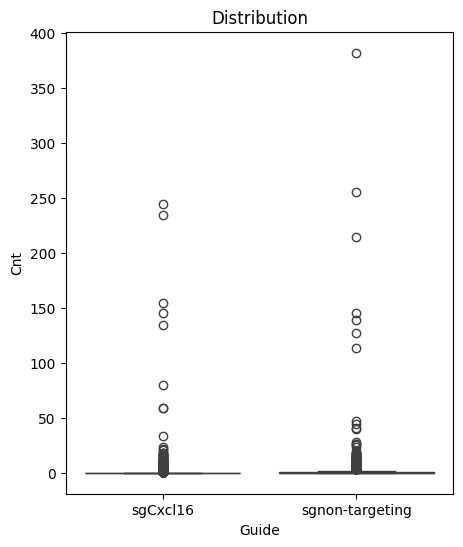

In [12]:
x = cdata[fdata.obs["cluster_cellcharter_givenk"] == 2, "sgCxcl16"].X.toarray().flatten()
y = cdata[fdata.obs["cluster_cellcharter_givenk"] == 2, "sgnon-targeting"].X.toarray().flatten()
data = pd.DataFrame({
    'Values': list(x) + list(y),
    'Group': ['sgCxcl16'] * len(x) + ['sgnon-targeting'] * len(y)
})

plt.figure(figsize=(5, 6))
sns.boxplot(x='Group', y='Values', data=data)
plt.title('Distribution')
plt.xlabel('Guide')
plt.ylabel('Cnt')
plt.show()

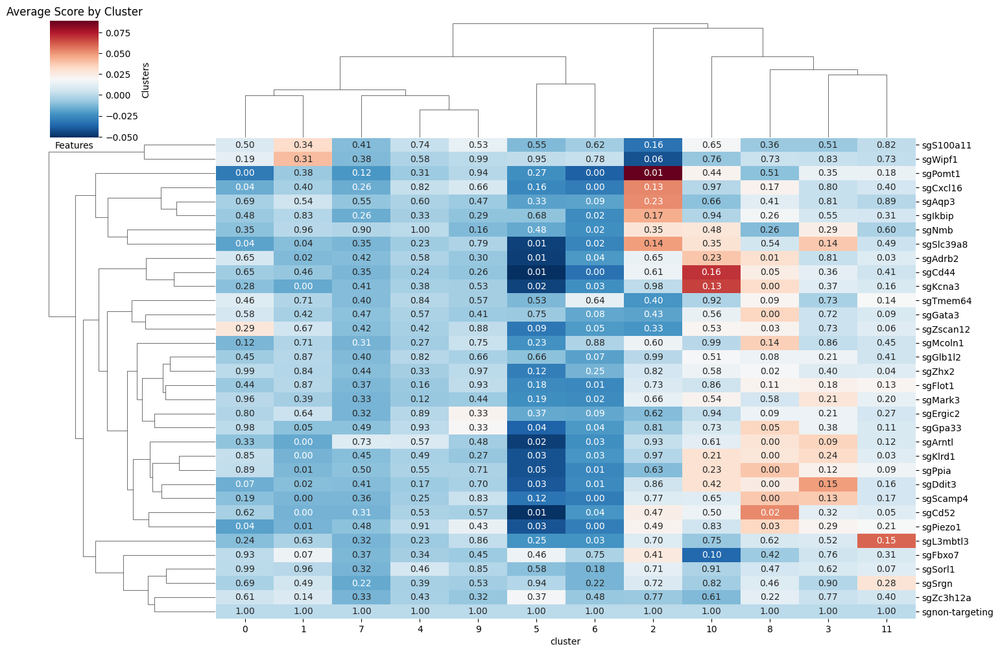

In [19]:
sns.clustermap(guide_cluster_proportions, annot=p_df, fmt=".2f", cmap="RdBu_r", figsize=(15, 10))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

In [44]:
# proportion matrix for each gene and cluster
cdata.obs["cluster_cellcharter_givenk"] = fdata.obs["cluster_cellcharter_givenk"].tolist()
guide_cluster_counts = pd.DataFrame(cdata.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata.obs["cluster_cellcharter_givenk"].tolist()
guide_cluster_counts["time_point"] = cdata.obs["time_point"].tolist()

guide_total_counts = guide_cluster_counts.sum(axis=0)[:-1]
guide_cluster_proportions = guide_cluster_counts.groupby(["time_point", "cluster"]).sum()
guide_cluster_proportions = guide_cluster_proportions.apply(pd.to_numeric, errors="coerce")
guide_cluster_proportions = guide_cluster_proportions / guide_total_counts
guide_cluster_proportions = guide_cluster_proportions.T.loc[guide_cluster_proportions.columns != "cluster"]
guide_cluster_proportions = guide_cluster_proportions.apply(pd.to_numeric)
ntc_guide_counts = guide_cluster_proportions.iloc[-1]
guide_cluster_proportions = guide_cluster_proportions - ntc_guide_counts

In [45]:
guide_cluster_proportions

time_point              1                                                    \
cluster                0         1         2         3         4         5    
sgAdrb2          0.009417  0.000858  0.022831  0.011826  0.002267  0.004348   
sgAqp3          -0.009456 -0.002407 -0.023884 -0.014757 -0.001213 -0.003602   
sgArntl          0.015675  0.002419  0.012725  0.031434  0.015542  0.004565   
sgCd44           0.008385  0.000441  0.002107  0.018495  0.002274  0.002975   
sgCd52           0.012201  0.000381  0.028294  0.010318  0.004049  0.000941   
sgCxcl16        -0.017590 -0.001603 -0.024112 -0.020139 -0.002638 -0.002251   
sgDdit3          0.002744  0.000554 -0.002831  0.034964  0.000539  0.001043   
sgErgic2        -0.003531 -0.000157 -0.009879  0.006335  0.002659  0.000706   
sgFbxo7         -0.019580 -0.002574 -0.029034 -0.021651 -0.002749 -0.004750   
sgFlot1         -0.006713 -0.001745 -0.015650 -0.010331 -0.001398 -0.000674   
sgGata3          0.011241  0.000113  0.000455  0.002877  0.002359  0.002785   
sgGlb1l2        -0.003237 -0.000168 -0.004976  0.000020  0.001337  0.000147   
sgGpa33          0.011853 -0.000034  0.009284  0.017892  0.001848  0.003316   
sgIkbip         -0.011927 -0.001716 -0.019258 -0.011290 -0.000879 -0.003687   
sgKcna3          0.014504  0.000384  0.012287  0.019669  0.003591  0.006107   
sgKlrd1          0.028523  0.002370  0.030942  0.045163  0.004580  0.006544   
sgL3mbtl3       -0.013229 -0.001606 -0.012414 -0.011592 -0.002007 -0.003794   
sgMark3         -0.011861 -0.001382 -0.018955 -0.015567 -0.002723 -0.003609   
sgMcoln1        -0.012556 -0.001294 -0.021797 -0.012081 -0.001182 -0.003427   
sgNmb           -0.008527 -0.001810 -0.017010  0.005038 -0.002592 -0.002934   
sgPiezo1        -0.000733  0.000256 -0.007353  0.019877  0.001471  0.000003   
sgPomt1         -0.015206 -0.001638 -0.006913 -0.007875 -0.002387  0.001189   
sgPpia           0.015549  0.001105  0.009687  0.015169  0.003384  0.013185   
sgS100a11       -0.005668 -0.000557 -0.015072 -0.007526 -0.000923 -0.000492   
sgScamp4         0.007593  0.001468  0.021274  0.021802  0.001130  0.002646   
sgSlc39a8       -0.003669 -0.000434 -0.013575  0.016788  0.001196  0.002077   
sgSorl1         -0.011090 -0.001887 -0.011623 -0.014663 -0.001287 -0.003022   
sgSrgn          -0.013132 -0.001478 -0.012182 -0.011151 -0.001011 -0.004760   
sgTmem64         0.000010 -0.001094 -0.008712 -0.001119  0.001321 -0.000736   
sgWipf1         -0.004659 -0.001514 -0.015299 -0.005744 -0.000192 -0.002283   
sgZc3h12a       -0.019483 -0.001726 -0.024257 -0.021714 -0.002711 -0.004419   
sgZhx2           0.003580  0.000155  0.005477  0.008587  0.001155  0.001150   
sgZscan12        0.031122  0.001049 -0.004342  0.003530  0.001434  0.001789   
sgnon-targeting  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

time_point                                               ...         3  \
cluster                6         7         8         9   ...        2    
sgAdrb2          0.005192 -0.008204  0.029823  0.007478  ... -0.001805   
sgAqp3          -0.004786 -0.013806 -0.033192 -0.009810  ... -0.001719   
sgArntl          0.004731  0.012716  0.035123  0.009885  ... -0.002724   
sgCd44           0.001559 -0.009247  0.022323  0.003412  ... -0.002724   
sgCd52           0.008039 -0.010525  0.041016  0.007844  ... -0.002465   
sgCxcl16        -0.008150 -0.015426 -0.038477 -0.008871  ... -0.002473   
sgDdit3          0.000563 -0.009850  0.015853  0.002869  ... -0.002668   
sgErgic2        -0.003977 -0.013339 -0.001843 -0.001904  ... -0.001361   
sgFbxo7         -0.009682 -0.017052 -0.050881 -0.012864  ...  0.000212   
sgFlot1         -0.004425 -0.011975 -0.019940 -0.006984  ... -0.002312   
sgGata3         -0.000117 -0.010932  0.020301  0.003291  ... -0.001304   
sgGlb1l2         0.000054 -0.011193 -0.004577 -0.000441  ... -0.002460   
sgGpa33          0.002173 -0.007983  0.041603  0.008319  ... -0.002076   
sgIkbip         -0.005838 -0.016347 -0.030082

In [46]:
p_df = np.zeros((len(np.unique(fdata.obs["cluster_cellcharter_givenk"])) * 3, 33))
for ic in np.unique(fdata.obs["cluster_cellcharter_givenk"]):
    for it in range(3):
        ntc_cnt_vec = cdata[(fdata.obs["cluster_cellcharter_givenk"] == ic) & (fdata.obs["time_point"] == f"{it + 1}"), "sgnon-targeting"].X.toarray().flatten()
        for ig, guide in enumerate(cdata.var_names[:-1]):
            guide_cnt_vec = cdata[(fdata.obs["cluster_cellcharter_givenk"] == ic) & (fdata.obs["time_point"] == f"{it + 1}"), guide].X.toarray().flatten()
            f_statistic, p_value = f_oneway(ntc_cnt_vec, guide_cnt_vec)
            p_df[it * 3 + ic, ig] = p_value
p_df = pd.DataFrame(p_df)
p_df = pd.concat([p_df, pd.DataFrame(np.ones((36, 1)))], axis=1)
p_df = p_df.applymap(p_value_to_significance).T

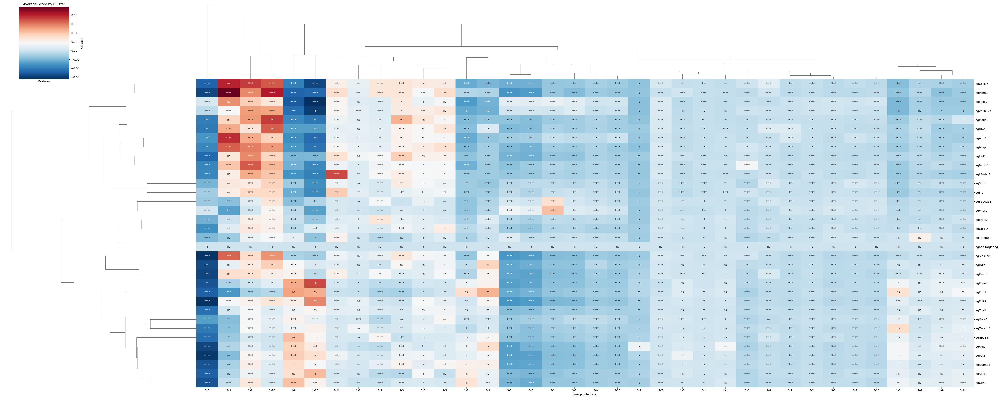

In [47]:
sns.clustermap(guide_cluster_proportions, annot=p_df, fmt="", cmap="RdBu_r", figsize=(50, 20))
plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

In [197]:
# One way annova test for each gene
guide_cluster_long = guide_cluster_proportions.reset_index().melt(id_vars=['index'], var_name='cluster', value_name='proportion')
guide_cluster_long = guide_cluster_long.rename(columns={'index': 'gene'})
guide_cluster_long["cluster"] = pd.to_numeric(guide_cluster_long.loc[:,"cluster"])
guide_cluster_long["proportion"] = pd.to_numeric(guide_cluster_long.loc[:,"proportion"])

gene_pairs = list(combinations(guide_cluster_long['gene'].unique(), 2))
anova_results = []

def compare_genes(gene1, gene2, data):
    subset = data[data['gene'].isin([gene1, gene2])]
    model = ols('proportion ~ C(gene) + C(cluster)', data=subset).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    return anova_table

for gene1, gene2 in gene_pairs:
    anova_table = compare_genes(gene1, gene2, guide_cluster_long)
    anova_results.append({
        'gene1': gene1,
        'gene2': gene2,
        'F': anova_table['F'][1],
        'p_value': anova_table['PR(>F)'][1]
    })

anova_results = pd.DataFrame(anova_results)
anova_results['significance'] = anova_results['p_value'].apply(lambda x: '****' if x < 0.0001 else 
                                                               '***' if x < 0.001 else 
                                                               '**' if x < 0.01 else 
                                                               '*' if x < 0.05 else 'ns')

KeyError: "The following id_vars or value_vars are not present in the DataFrame: ['index']"

In [34]:
anova_results[anova_results["gene2"] == "sgGata3"]

,gene1,gene2,F,p_value,significance
9,sgAdrb2,sgGata3,475.063501,4.477685e-13,****
41,sgAqp3,sgGata3,36.877627,4.533902e-07,****
72,sgArntl,sgGata3,137.678255,3.878671e-10,****
102,sgCd44,sgGata3,283.458923,7.564112e-12,****
131,sgCd52,sgGata3,120.448768,8.014289e-10,****
159,sgCxcl16,sgGata3,41.279437,2.503235e-07,****
186,sgDdit3,sgGata3,136.978317,3.987572e-10,****
212,sgErgic2,sgGata3,121.909965,7.506907e-10,****
237,sgFbxo7,sgGata3,123.981512,6.851137e-10,****
261,sgFlot1,sgGata3,24.384948,3.893701e-06,****


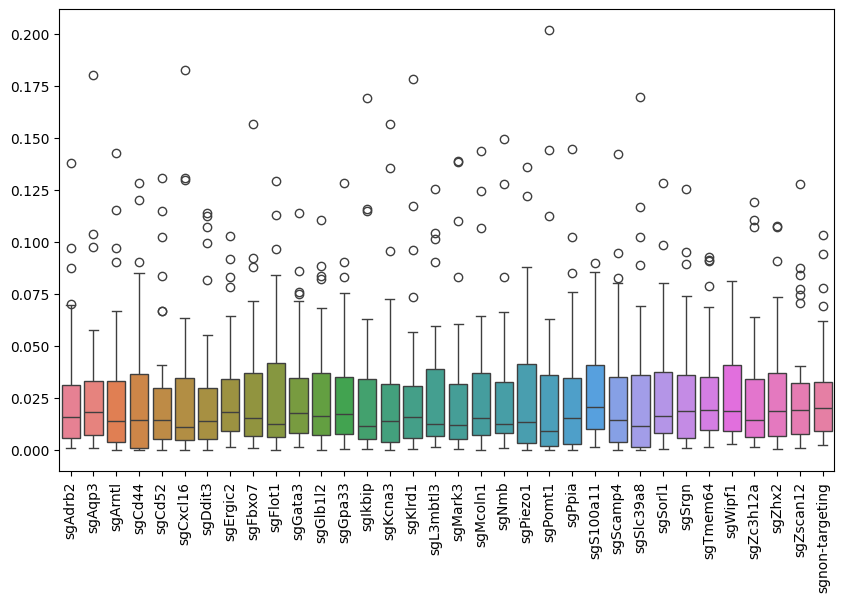

In [198]:
plt.figure(figsize=(10, 6))
sns.boxplot(guide_cluster_proportions.T)
plt.xticks(rotation=90)
plt.show()

# Cluster Specific guide distribution derived from DEGs expression

In [560]:
# First attempt
# time point day 4, cluster 5
cluster_id = 11
time_point = 2
cluster_deg = top_genes_df[top_genes_df["Cluster"] == f"{cluster_id}"]["Gene"].tolist()

fdata_1 = fdata[fdata.obs["time_point"] == f"{time_point}"]
cdata_1 = cdata[fdata.obs["time_point"] == f"{time_point}"]
mask = [True if str in cluster_deg else False for str in fdata.var_names]
sc.tl.rank_genes_groups(fdata_1, groupby="cluster_cellcharter_givenk", method="t-test", key_added="time_rank_genes_groups")

l2fc_vector = pd.DataFrame(fdata_1.uns["time_rank_genes_groups"]["logfoldchanges"][mask]).iloc[:, cluster_id]
l2fc_vector = np.array(l2fc_vector.tolist()).reshape(1, -1)
guide_vector = guide_cluster_proportions.iloc[:, (time_point - 1) * 12 + cluster_id]
guide_vector = np.array(guide_vector.tolist()).reshape(1, -1)

regr = ElasticNet(alpha=1e-2, l1_ratio=1, max_iter=1000000, random_state=555)
regr.fit(X=l2fc_vector, y=guide_vector)

corr_matrix = regr.coef_

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:640: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


In [561]:
np.sum(corr_matrix) # Does not converge

0.0

In [48]:
# Second attempt
# time point day 4, cluster 5 BINS
cluster_id = 2
time_point = 2
cluster_deg = top_genes_df[top_genes_df["Cluster"] == f"{cluster_id}"]["Gene"].tolist()

fdata_1 = fdata[fdata.obs["time_point"] == f"{time_point}"]
cdata_1 = cdata[fdata.obs["time_point"] == f"{time_point}"]

ntc_vector = cdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id][:, -1].X.toarray().T
guide_vector = cdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id][:, :-1].X.toarray().T

expr_df = pd.DataFrame(fdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id][:, cluster_deg].X.toarray())
expr_df.columns = cluster_deg

cluster_pathway = go_df[go_df["Cluster"] == cluster_id][["Name", "Genes"]]
go_expr_df = pd.DataFrame(index=expr_df.index)
for index, row in cluster_pathway.iterrows():
    pathway = row["Name"]
    genes = row["Genes"].split(';')
    genes = [s[0] + s[1:].lower() for s in genes]
    go_expr_df[pathway] = expr_df[genes].mean(axis=1)

corr_matrix = np.zeros((len(guide_vector), len(cluster_pathway)))
for i in range(len(guide_vector)):

    guide_null = [x == 0 for x in guide_vector[i]]
    ntc_null = [x == 0 for x in ntc_vector][0]
    mask = [~(a and b) for a, b in zip(guide_null, ntc_null)]
    #mask = [True for b in ntc_null]

    guide_vector[i] = guide_vector[i] - ntc_vector

    filt_guide_vector = np.array(guide_vector[i])[mask]
    filt_expr_vector = np.array(go_expr_df)[mask]

    regr=ElasticNet(alpha=0.0001, l1_ratio=0.001, max_iter=100000)
    regr.fit(X=filt_expr_vector, y=filt_guide_vector)

    corr_matrix[i] = regr.coef_

Text(0.5, 1.0, 'Cluster 2 - Time 2, L2FC vs NTC')

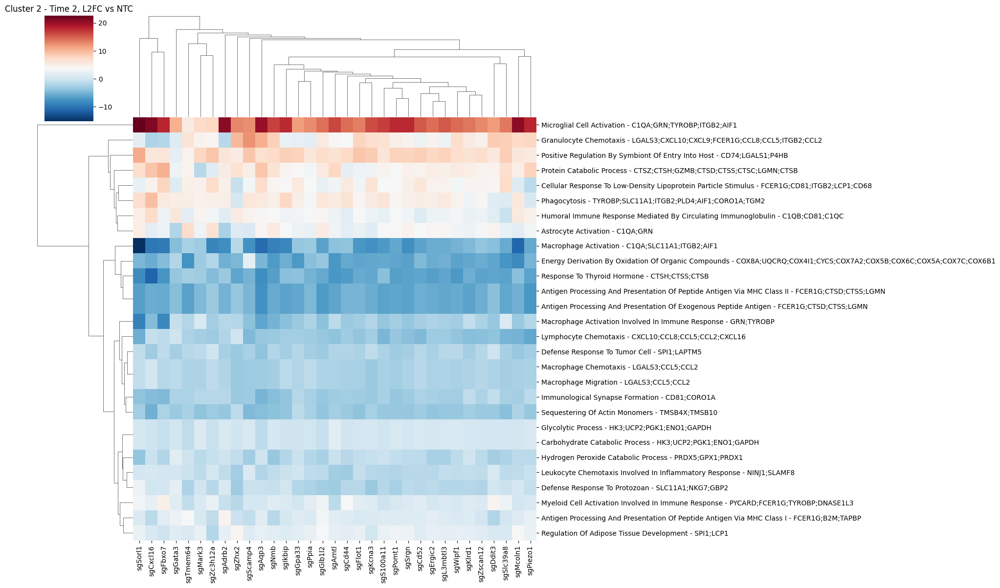

In [50]:
#fig, ax = plt.subplots(figsize=(10, 8))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names[:-1], columns=cluster_pathway)

# interests = []
# for ig, g in enumerate(cdata.var_names[:-1]):
#     t = corr_df.iloc[ig, :].sort_values(ascending=False)
#     interests += [gene for gene in t.index[:3]]
#     t = corr_df.iloc[ig, :].sort_values(ascending=True)
#     interests += [gene for gene in t.index[-3:]]

# interests = np.unique(interests)
# corr_df = corr_df.loc[:, interests]

gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.clustermap(corr_df.T, cmap="RdBu_r", xticklabels=corr_df.index, yticklabels=[name + " - " + genes for name, genes in zip(cluster_pathway["Name"], cluster_pathway["Genes"])], figsize=(20, 12))
plt.title(f"Cluster {cluster_id} - Time {time_point}, L2FC vs NTC")

In [52]:
fdata

AnnData object with n_obs × n_vars = 66509 × 16001
    obs: 'time_point', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cluster_cellcharter_givenk', 'spatial_cov'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik'
    uns: '_cellcharter', '_scvi_manager_uuid', '_scvi_uuid', 'cluster_cellcharter_givenk_colors', 'log1p', 'rank_genes_groups', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'X_scVI', 'spatial'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [20]:
cluster_pathway

,Name,Genes
10,Neuron Cell-Cell Adhesion,NRXN3;NRXN2;ASTN2
23,Negative Regulation Of Long-Term Synaptic Pote...,APOE;PTN
2,Glutamate Receptor Signaling Pathway,GRIN2A;GRID2;GRM4;GRIK4;GRIN2B
3,"Chemical Synaptic Transmission, Postsynaptic",GLRA1;GRIN2A;GRID2;GRIN2B
25,Glycerolipid Metabolic Process,DGKG;DGKB
...,...,...
322,Translation,RACK1
323,Cytokine-Mediated Signaling Pathway,SLC27A1
324,Regulation Of Cell Cycle,RACK1
325,Vesicle-Mediated Transport,LRP2


In [62]:
gdata = cdata.copy()
adata = fdata.copy()

In [68]:
adata.obs

,time_point,n_genes,n_counts,_scvi_batch,_scvi_labels,cluster_cellcharter_givenk,spatial_cov
1001_1,1,231,302,0,0,9,"1_0,1_1000"
1101_1,1,271,347,0,0,9,"1_0,1_1100"
11101_1,1,41,48,0,0,9,"1_0,1_11100"
11201_1,1,189,270,0,0,9,"1_0,1_11200"
11301_1,1,358,588,0,0,2,"1_0,1_11300"
...,...,...,...,...,...,...,...
171289401_3,3,2336,5989,2,0,8,"3_9900,3_9500"
171289501_3,3,1309,2456,2,0,5,"3_9900,3_9600"
171289601_3,3,929,1530,2,0,5,"3_9900,3_9700"
171289701_3,3,1856,4160,2,0,8,"3_9900,3_9800"


In [82]:
gdata

AnnData object with n_obs × n_vars = 66509 × 34
    obs: 'time_point', 'cluster_cellcharter_givenk', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'spatial', 'spatial_cov'

In [109]:
# Second attempt
# time point day 4, cluster 5 BINS
cluster_id = 5
time_point = 3
cluster_deg = top_genes_df[top_genes_df["Cluster"] == f"{cluster_id}"]["Gene"].tolist()

fdata_1 = fdata[fdata.obs["time_point"] == f"{time_point}"]
cdata_1 = cdata[fdata.obs["time_point"] == f"{time_point}"]

ntc_vector = cdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id][:, -1].X.toarray().T
guide_vector = cdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id].X.toarray().T

expr_df = pd.DataFrame(fdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id][:, cluster_deg].X.toarray())
expr_df.columns = cluster_deg

cluster_pathway = go_df[go_df["Cluster"] == cluster_id][["Name", "Genes"]]
go_expr_df = pd.DataFrame(index=expr_df.index)
for index, row in cluster_pathway.iterrows():
    pathway = row["Name"]
    genes = row["Genes"].split(';')
    genes = [s[0] + s[1:].lower() for s in genes]
    go_expr_df[pathway] = expr_df[genes].mean(axis=1)

corr_matrix = np.zeros((len(guide_vector), len(cluster_pathway)))
param_grid = {
    'alpha': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 2, 5, 10, 20, 50],
}
for i in tqdm(range(len(guide_vector))):

    guide_null = [x == 0 for x in guide_vector[i]]
    #other_guide_null = [(np.sum(guide_vector[:, j]) - guide_vector[i, j]) > 0 for j in range(len(guide_vector[i]))]
    # ntc_null = [x == 0 for x in ntc_vector][0]
    # mask = [~(a and b) for a, b in zip(guide_null, ntc_null)]
    #mask = [True for b in ntc_null]
    mask = [~ a for a in guide_null]
    #mask = [~ (a & b) for a, b in zip(guide_null, other_guide_null)]

    guide_vector[i] = guide_vector[i] - ntc_vector

    filt_guide_vector = np.array(guide_vector[i])[mask]
    filt_expr_vector = np.array(go_expr_df)[mask]

    regr=ElasticNet(max_iter=100000, l1_ratio=0.5)
    grid_regr = GridSearchCV(regr, param_grid, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=0)
    grid_regr.fit(X=filt_expr_vector, y=filt_guide_vector)
    regr = grid_regr.best_estimator_
    print(regr.get_params())
    #print(grid_regr.get_params())
    
    regr.fit(X=filt_expr_vector, y=filt_guide_vector)

    corr_matrix[i] = regr.coef_

  3%|▎         | 1/34 [00:10<05:34, 10.12s/it]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


  9%|▉         | 3/34 [00:10<01:17,  2.51s/it]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 15%|█▍        | 5/34 [00:11<00:30,  1.05s/it]

{'alpha': 10, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 10, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 21%|██        | 7/34 [00:11<00:14,  1.83it/s]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 26%|██▋       | 9/34 [00:11<00:08,  3.01it/s]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 29%|██▉       | 10/34 [00:11<00:06,  3.71it/s]

{'alpha': 10, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 35%|███▌      | 12/34 [00:12<00:04,  4.62it/s]

{'alpha': 0.1, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 1, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 41%|████      | 14/34 [00:12<00:03,  5.59it/s]

{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 47%|████▋     | 16/34 [00:12<00:02,  6.57it/s]

{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 53%|█████▎    | 18/34 [00:12<00:02,  7.09it/s]

{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 59%|█████▉    | 20/34 [00:13<00:01,  7.50it/s]

{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 10, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 65%|██████▍   | 22/34 [00:13<00:01,  7.80it/s]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 50, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 71%|███████   | 24/34 [00:13<00:01,  7.86it/s]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 1, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 76%|███████▋  | 26/34 [00:13<00:01,  7.73it/s]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 82%|████████▏ | 28/34 [00:14<00:00,  7.25it/s]

{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 88%|████████▊ | 30/34 [00:14<00:00,  7.20it/s]

{'alpha': 0.5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 1, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 94%|█████████▍| 32/34 [00:14<00:00,  6.76it/s]

{'alpha': 0.5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
{'alpha': 5, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


 97%|█████████▋| 33/34 [00:14<00:00,  6.90it/s]

{'alpha': 2, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

{'alpha': 0.0001, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 0.5, 'max_iter': 100000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
100%|██████████| 34/34 [00:16<00:00,  2.10it/s]


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:615: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(0, max_dependent_coord * 1.05)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:623: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(0, max_dependent_coord * 1.05)


Text(0.5, 1.0, 'Cluster 5 - Time 3, L2FC vs NTC')

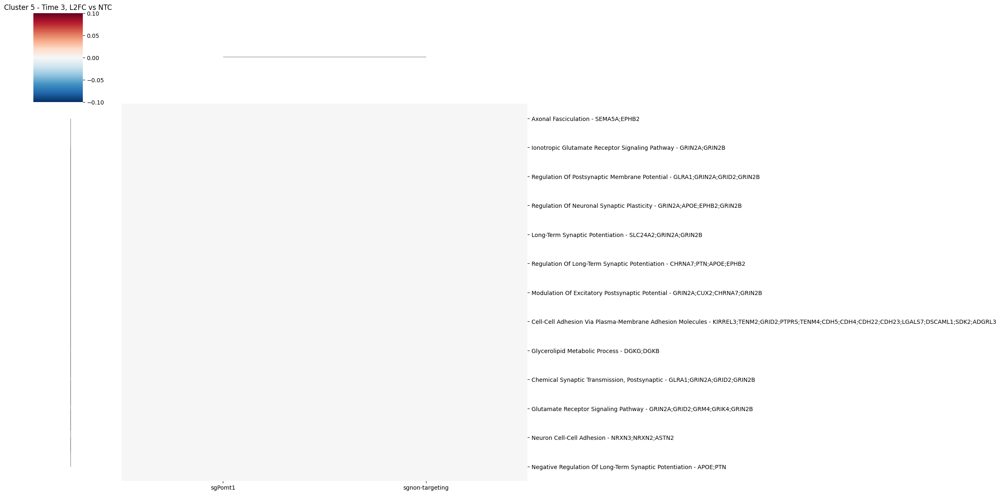

In [110]:
#fig, ax = plt.subplots(figsize=(10, 8))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names, columns=cluster_pathway)

interests = ["sgnon-targeting", "sgPomt1"]

interests = np.unique(interests)
corr_df = corr_df.loc[interests, :]

gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.clustermap(corr_df.T, cmap="RdBu_r", xticklabels=corr_df.index, yticklabels=[name + " - " + genes for name, genes in zip(cluster_pathway["Name"], cluster_pathway["Genes"])], figsize=(24, 12))
plt.title(f"Cluster {cluster_id} - Time {time_point}, L2FC vs NTC")

In [111]:
cdata

AnnData object with n_obs × n_vars = 66509 × 34
    obs: 'time_point', 'cluster_cellcharter_givenk'
    obsm: 'spatial', 'spatial_cov'

Text(0.5, 1.0, 'Cluster 5 - Time 3, L2FC vs NTC')

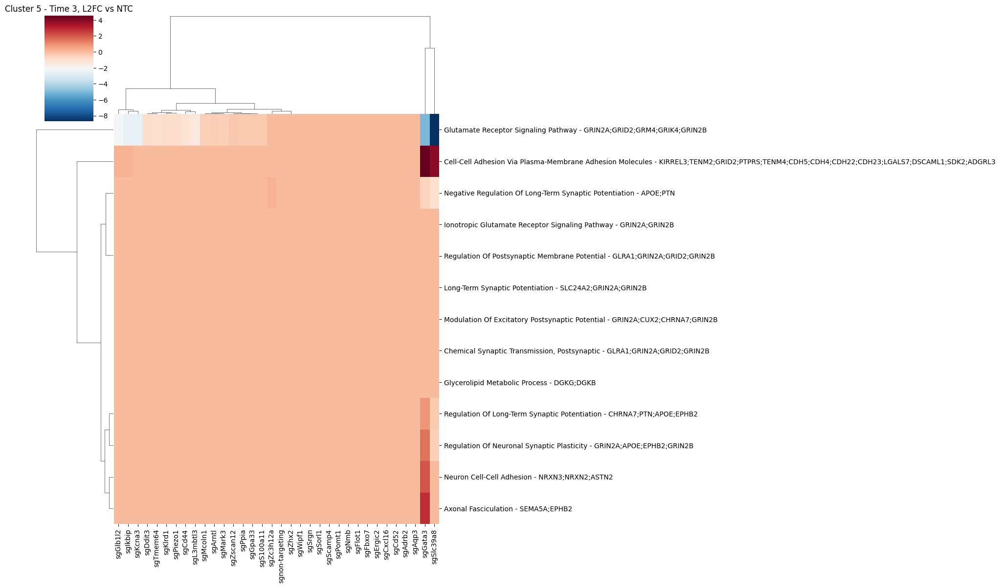

In [112]:
#fig, ax = plt.subplots(figsize=(10, 8))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names, columns=cluster_pathway)

# interests = []
# for ig, g in enumerate(cdata.var_names[:-1]):
#     t = corr_df.iloc[ig, :].sort_values(ascending=False)
#     interests += [gene for gene in t.index[:3]]
#     t = corr_df.iloc[ig, :].sort_values(ascending=True)
#     interests += [gene for gene in t.index[-3:]]

# interests = np.unique(interests)
# corr_df = corr_df.loc[:, interests]

gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.clustermap(corr_df.T, cmap="RdBu_r", xticklabels=corr_df.index, yticklabels=[name + " - " + genes for name, genes in zip(cluster_pathway["Name"], cluster_pathway["Genes"])], figsize=(20, 12))
plt.title(f"Cluster {cluster_id} - Time {time_point}, L2FC vs NTC")

In [798]:
# Second attempt
# time point day 4, cluster 5 BINS
cluster_id = 2
time_point = 2
cluster_deg = top_genes_df[top_genes_df["Cluster"] == f"{cluster_id}"]["Gene"].tolist()

fdata_1 = fdata[fdata.obs["time_point"] == f"{time_point}"]
cdata_1 = cdata[fdata.obs["time_point"] == f"{time_point}"]

guide_vector = cdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id].X.toarray().T

expr_df = pd.DataFrame(fdata_1[fdata_1.obs["cluster_cellcharter_givenk"] == cluster_id][:, cluster_deg].X.toarray())
expr_df.columns = cluster_deg

cluster_pathway = go_df[go_df["Cluster"] == cluster_id][["Name", "Genes"]]
go_expr_df = pd.DataFrame(index=expr_df.index)
for index, row in cluster_pathway.iterrows():
    pathway = row["Name"]
    genes = row["Genes"].split(';')
    genes = [s[0] + s[1:].lower() for s in genes]

    go_expr_df[pathway] = expr_df[genes].mean(axis=1)

corr_matrix = np.zeros((len(guide_vector), len(cluster_pathway)))
for i in range(len(guide_vector)):

    guide_null = [x == 0 for x in guide_vector[i]]
    mask = [~ a for a in guide_null]
    #mask = [True for a in guide_null]

    filt_guide_vector = np.array(guide_vector[i])[mask]
    filt_expr_vector = np.array(go_expr_df)[mask]

    regr = ElasticNet(alpha=0.1, l1_ratio=0.5, max_iter=1000000, random_state=555)
    regr.fit(X=filt_expr_vector, y=filt_guide_vector)

    corr_matrix[i] = regr.coef_

In [799]:
np.sum(corr_matrix)

48.30204118885483

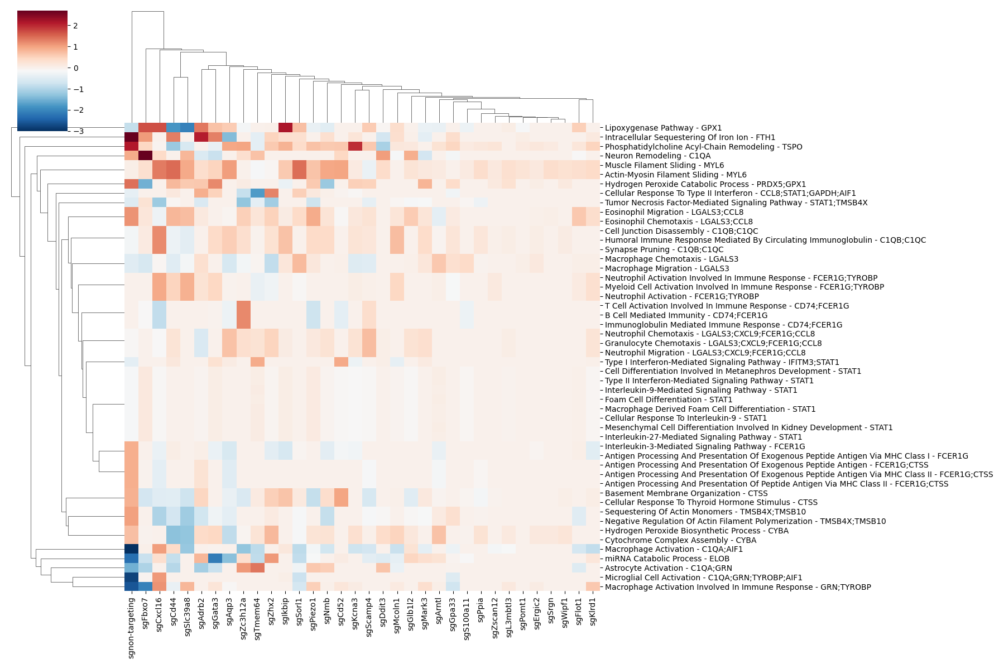

In [800]:
#fig, ax = plt.subplots(figsize=(10, 8))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names, columns=cluster_deg)

# interests = []
# for ig, g in enumerate(cdata.var_names[:-1]):
#     t = corr_df.iloc[ig, :].sort_values(ascending=False)
#     interests += [gene for gene in t.index[:3]]
#     t = corr_df.iloc[ig, :].sort_values(ascending=True)
#     interests += [gene for gene in t.index[-3:]]

# interests = np.unique(interests)
# corr_df = corr_df.loc[:, interests]

gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.clustermap(corr_df.T, cmap="RdBu_r", xticklabels=corr_df.index, yticklabels=[name + " - " + genes for name, genes in zip(cluster_pathway["Name"], cluster_pathway["Genes"])], figsize=(18, 12))

In [437]:
cluster_id = 5
cluster_deg = top_genes_df[top_genes_df["Cluster"] == f"{cluster_id}"]["Gene"].tolist()

mask = [True if str in cluster_deg else False for str in fdata.var_names]
clusters = fdata.obs["cluster_cellcharter_givenk"]
l2fc_matrix = np.zeros((3, len(np.unique(clusters)), len(cluster_deg)))

for it in range(3):
    for ig, gene in enumerate(fdata.uns["rank_genes_groups"]["logfoldchanges"][mask]):
        l2fc_matrix[it, :, ig] = [item for item in vec]

['Mroh4',
 'Clec2e',
 'Slc6a1',
 'Dnajb8',
 'Actl6b',
 'Sult4a1',
 'Jhy',
 'Slc26a5',
 'Drd3',
 'Esrp1',
 'Ankdd1a',
 'Epha8',
 'Chrna7',
 'Prmt8',
 'Pnpla1',
 'Sez6',
 'Kcnk12',
 'Jakmip3',
 'Crhr1',
 'Alx4',
 'Insc',
 'Rsph14',
 'Arhgap40',
 'Muc4',
 'Elf5',
 'Mmd2',
 'Slc12a3',
 'Bhmt',
 'Pax5',
 'Ccdc187',
 'Atxn7l1os1',
 'Ankrd31',
 'Igdcc3',
 'Grm4',
 'Gsg1l',
 'Ccdc13',
 'Mroh8',
 'Atp2b2',
 'Rbfox3',
 'Vsnl1',
 'Col2a1',
 'Lrp2',
 'Sycp2l',
 'Loxhd1',
 'Cdh22',
 'Olfm2',
 'Umodl1',
 'Plch2',
 'AC134453.1',
 'Grin2a']

# Guide distribution and correlation with DEGs

Linear model to deteremine correlation

In [311]:
# l2fc matrix and guide proportion matrix
mask = [True if str in deg else False for str in fdata.var_names]
clusters = fdata.obs["cluster_cellcharter_givenk"]
l2fc_matrix = np.zeros((len(np.unique(clusters)), len(deg)))
for i, vec in enumerate(fdata.uns["rank_genes_groups"]["logfoldchanges"][mask]):
    l2fc_matrix[:, i] = [item for item in vec]

# case 1: proportion
guide_matrix = np.array(guide_cluster_proportions.T)

# case 2: raw count / log count
# guide_matrix = np.zeros((len(np.unique(clusters)), 34))
# cluster_matrix = [cdata[fdata.obs["cluster_cellcharter_givenk"] == i].X.toarray() for i in range(len(np.unique(clusters)))]
# for i in range(len(np.unique(clusters))):
#     guide_sum_vec = [np.sum(vec) for vec in cluster_matrix[i].T]
#     guide_matrix[i, :] = guide_sum_vec

# corr_matrix = np.zeros((len(deg), len(cdata.var_names)))

regr = ElasticNet(random_state=999, max_iter=20000, alpha=0.01, l1_ratio=0.5)
regr.fit(X=l2fc_matrix, y=guide_matrix)
corr_matrix = regr.coef_

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


                 Ibsp  Ntrk1  Krt27  Pate1  Cdk5r2  Nlrp4e  Serpinb2  Aqp3  \
sgAdrb2          17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgAqp3           17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgArntl          17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgCd44           17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgCd52           17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgCxcl16         17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgDdit3          17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgErgic2         17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgFbxo7          17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgFlot1          17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgGata3          17.5   17.5   17.5   17.5    17.5    17.5      17.5  17.5   
sgGlb1l2         17.5   17.5   17.5   17.5    17.5    17.5      

TypeError: unhashable type: 'Index'

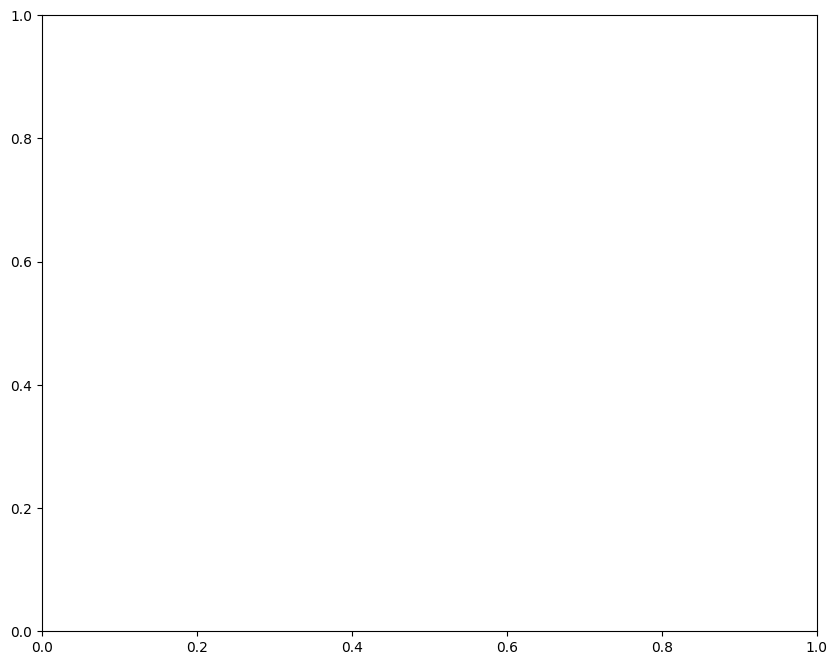

In [325]:
fig, ax = plt.subplots(figsize=(10, 8))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names, columns=deg)

for cluster in np.unique(top_genes_df['Cluster']):
    genes_in_cluster = top_genes_df[top_genes_df['Cluster'] == cluster]['Gene']
    correlation_in_cluster = corr_df[genes_in_cluster]
    ranking = correlation_in_cluster.rank(ascending=False)
    
    top_genes_in_cluster = ranking.apply(lambda x: x.nsmallest(10).index, axis=1).values.flatten()
    top_genes_in_cluster = list(set(top_genes_in_cluster))
    top_genes[cluster] = top_genes_in_cluster

selected_genes = set(gene for genes in top_genes.values() for gene in genes)
corr_df = corr_df[selected_genes]

# distance_matrix_gRNA = 1 - corr_df.T.corr()
# Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
# gRNA_order = leaves_list(Z_gRNA)
# distance_matrix_gRNA = 1 - corr_df.corr()
# Z_RNA = linkage(distance_matrix_gRNA, method='ward')
# RNA_order = leaves_list(Z_RNA)

# corr_df = corr_df.iloc[gRNA_order, RNA_order]

gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.heatmap(corr_df.T, cmap="flare", xticklabels=corr_df.index, yticklabels=[gene + " - " + cluster for gene, cluster in zip(corr_df.columns, gene_clusters)], ax=ax)

corr_df.to_csv("IN_DEG.csv", sep="\t")

# Non-targeting Control baseline

In [290]:
# case 3, ntc as baseline
guide_matrix = np.zeros((len(np.unique(clusters)), 33))
cluster_matrix = [cdata[fdata.obs["cluster_cellcharter_givenk"] == i, :-1].X.toarray() for i in range(len(np.unique(clusters)))]
ntc_matrix = [cdata[fdata.obs["cluster_cellcharter_givenk"] == i, -1].X.toarray() for i in range(len(np.unique(clusters)))]
ntc_sum_vec = [np.sum(vec) for vec in ntc_matrix]
for i in range(len(np.unique(clusters))):
    guide_sum_vec = [np.sum(vec) for vec in cluster_matrix[i].T]
    guide_matrix[i, :] = guide_sum_vec - ntc_sum_vec[i]

corr_matrix = np.zeros((len(deg), len(cdata.var_names)))

regr = ElasticNet(random_state=999, max_iter=20000, alpha=1000, l1_ratio=0.5)
regr.fit(X=l2fc_matrix, y=guide_matrix)
corr_matrix = regr.coef_

/tmp/ipykernel_17776/408903598.py:15: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
/tmp/ipykernel_17776/408903598.py:18: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_RNA = linkage(distance_matrix_gRNA, method='ward')


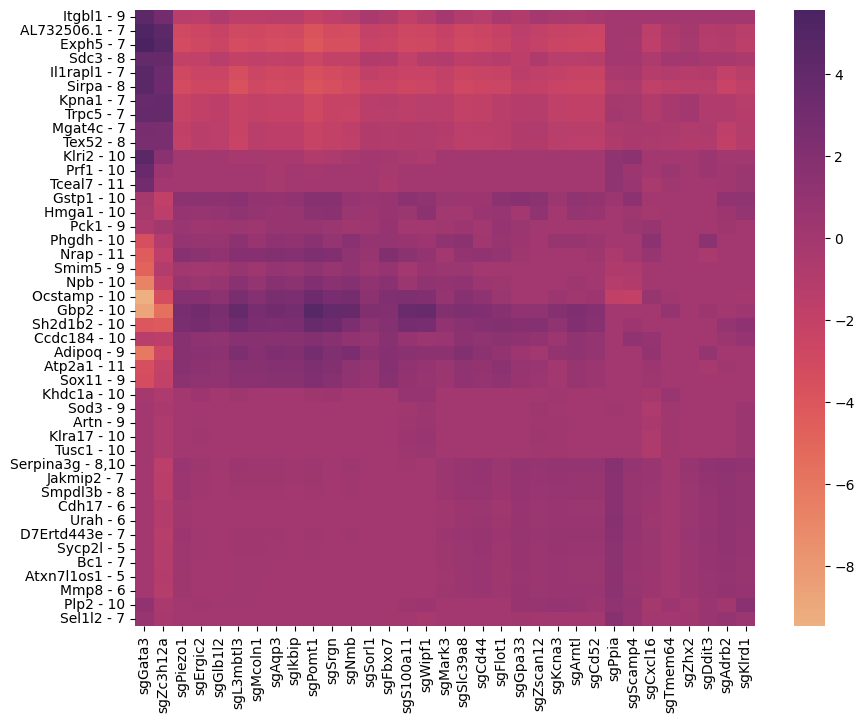

In [291]:
fig, ax = plt.subplots(figsize=(10, 8))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names[:-1], columns=deg)

interests = []
for ig, g in enumerate(cdata.var_names[:-1]):
    t = corr_df.iloc[ig, :].sort_values(ascending=False)
    interests += [gene for gene in t.index[:10]]
    t = corr_df.iloc[ig, :].sort_values(ascending=True)
    interests += [gene for gene in t.index[-10:]]

interests = np.unique(interests)
corr_df = corr_df.loc[:, interests]

distance_matrix_gRNA = 1 - corr_df.T.corr()
Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
gRNA_order = leaves_list(Z_gRNA)
distance_matrix_gRNA = 1 - corr_df.corr()
Z_RNA = linkage(distance_matrix_gRNA, method='ward')
RNA_order = leaves_list(Z_RNA)

corr_df = corr_df.iloc[gRNA_order, RNA_order]

gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.heatmap(corr_df.T, cmap="flare", xticklabels=corr_df.index, yticklabels=[gene + " - " + cluster for gene, cluster in zip(corr_df.columns, gene_clusters)], ax=ax)

corr_df.to_csv("IN_DEG.csv", sep="\t")

In [224]:
# determine zscore and specific genes
sig_genes = {}
for idx, gene_name in enumerate(cdata.var_names):
    beta = corr_matrix[idx, :]
    z_scores = (beta - np.mean(beta)) / np.std(beta)

    sig_indices = np.where(z_scores > 0.66)[0]
    sig_genes[gene_name] = [deg[i] for i in sig_indices]
    
gene_cluster = {}
for gene, sig in sig_genes.items():
    #print(top_genes_df[np.isin(top_genes_df.loc[:, "Gene"], sig)])
    gene_cluster[gene] = np.unique(top_genes_df[np.isin(top_genes_df.loc[:, "Gene"], sig)].loc[:,"Cluster"])
gene_cluster

{'sgAdrb2': array(['10', '11', '7', '9'], dtype=object),
 'sgAqp3': array(['10', '11', '7', '8', '9'], dtype=object),
 'sgArntl': array(['10', '11', '7', '9'], dtype=object),
 'sgCd44': array(['7'], dtype=object),
 'sgCd52': array(['11', '7', '9'], dtype=object),
 'sgCxcl16': array(['10', '11', '7', '9'], dtype=object),
 'sgDdit3': array(['10', '11', '7', '8', '9'], dtype=object),
 'sgErgic2': array(['10', '11', '7', '8'], dtype=object),
 'sgFbxo7': array(['10', '7', '8', '9'], dtype=object),
 'sgFlot1': array(['10', '11', '7', '8', '9'], dtype=object),
 'sgGata3': array(['10', '7', '8', '9'], dtype=object),
 'sgGlb1l2': array(['10', '11', '7', '8', '9'], dtype=object),
 'sgGpa33': array(['11', '7', '8'], dtype=object),
 'sgIkbip': array(['10', '11', '7', '8', '9'], dtype=object),
 'sgKcna3': array(['10', '11', '7'], dtype=object),
 'sgKlrd1': array(['10', '11', '7', '9'], dtype=object),
 'sgL3mbtl3': array(['10', '11', '7', '9'], dtype=object),
 'sgMark3': array(['10', '11', '7', '8',

In [225]:
enrs = {}
for gene, sig in sig_genes.items():
    print(sig)
    enr = gp.enrichr(gene_list=sig,
                gene_sets=["KEGG_2019_Mouse"],
                background=None)
    enrs[gene] = enr.results

fig = plt.figure(figsize=(8, 50))
for gene in sig_genes.keys():
    ax = plt.subplot(len(sig_genes), 1, i+1)
    results = enrs[gene].sort_values(by='Combined Score', ascending=False).head(10)  # Select top 10 results for visualization

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.title(f"{gene}", loc="left")
    plt.gca().invert_yaxis()

['AL732506.1', 'Tmem56', 'Adamts19', 'Crb1', 'Exph5', 'Itgbl1', 'Prf1', 'Pgam2']


JSONDecodeError: Expecting value: line 1 column 1 (char 0)

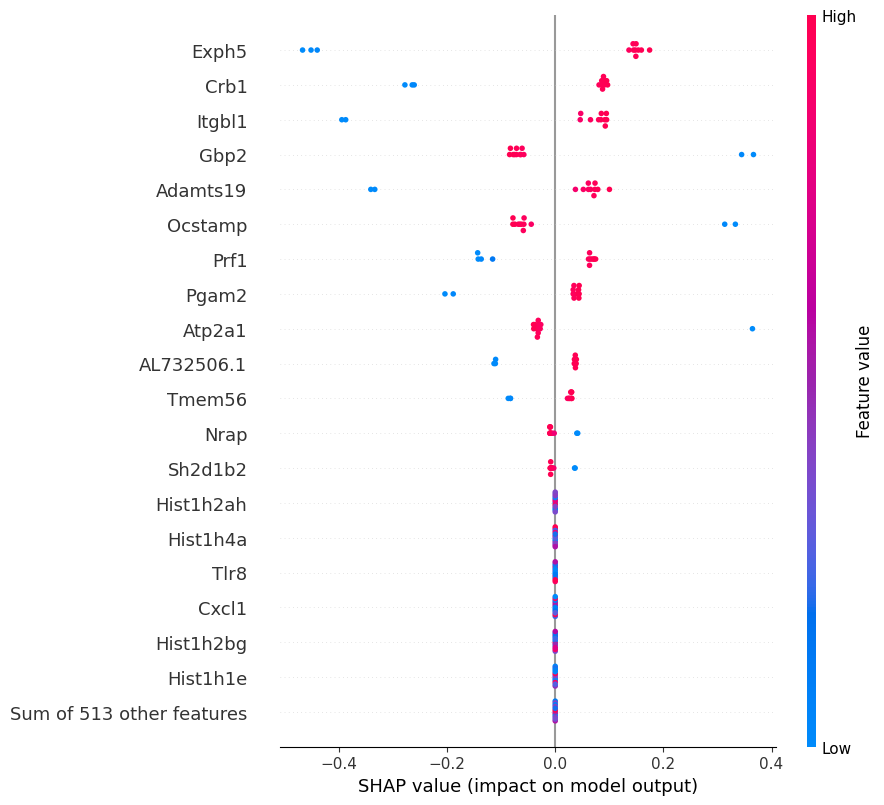

In [227]:
explainer = shap.Explainer(regr, l2fc_matrix)
l2fc_df = pd.DataFrame(l2fc_matrix)
l2fc_df.columns = deg
shap_values = explainer(l2fc_df)[:, :, 0]
feature_names = np.array([gene for gene in deg])
shap.plots.beeswarm(shap_values, max_display=20)

# DEG Correlation on the scale of time

In [239]:
fdata_1 = fdata[fdata.obs["time_point"] == "1"]
cdata_1 = cdata[fdata.obs["time_point"] == "1"]
fdata_2 = fdata[fdata.obs["time_point"] == "2"]
cdata_2 = cdata[fdata.obs["time_point"] == "2"]
fdata_3 = fdata[fdata.obs["time_point"] == "3"]
cdata_3 = cdata[fdata.obs["time_point"] == "3"]
sc.pp.normalize_total(fdata_1)
sc.pp.normalize_total(fdata_2)
sc.pp.normalize_total(fdata_3)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [270]:
regr = ElasticNet(random_state=999, max_iter=20000, alpha=1e-9, l1_ratio=1)

In [271]:
# proportion matrix for each gene and cluster
guide_cluster_counts = pd.DataFrame(cdata_1.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata_1.obs["cluster_cellcharter_givenk"].tolist()

guide_total_counts = guide_cluster_counts.sum(axis=0)[:-1]
guide_cluster_proportions = guide_cluster_counts.groupby("cluster").sum()
guide_cluster_proportions = guide_cluster_proportions.div(guide_total_counts, axis=1)
guide_cluster_proportions.index = guide_cluster_proportions.index.astype(int)
guide_cluster_proportions = guide_cluster_proportions.T.reindex(sorted(guide_cluster_proportions.index), axis=1)

sc.tl.rank_genes_groups(fdata_1, groupby="cluster_cellcharter_givenk", method="t-test")
mask = [True if str in deg else False for str in fdata_1.var_names]
clusters = fdata_1.obs["cluster_cellcharter_givenk"]
l2fc_matrix = np.zeros((len(np.unique(clusters)), len(deg)))
for i, vec in enumerate(fdata.uns["rank_genes_groups"]["logfoldchanges"][mask]):
    l2fc_matrix[:, i] = [item for item in vec]

guide_matrix = np.array(guide_cluster_proportions.T)
regr.fit(y=guide_matrix, X=l2fc_matrix)
corr_matrix_1 = regr.coef_

In [256]:
# proportion matrix for each gene and cluster
guide_cluster_counts = pd.DataFrame(cdata_1.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata_1.obs["cluster_cellcharter_givenk"].tolist()

sc.tl.rank_genes_groups(fdata_1, groupby="cluster_cellcharter_givenk", method="t-test")
mask = [True if str in deg else False for str in fdata_1.var_names]
clusters = fdata_1.obs["cluster_cellcharter_givenk"]
l2fc_matrix = np.zeros((len(np.unique(clusters)), len(deg)))
for i, vec in enumerate(fdata.uns["rank_genes_groups"]["logfoldchanges"][mask]):
    l2fc_matrix[:, i] = [item for item in vec]

guide_matrix = np.zeros((len(np.unique(clusters)), 34))
cluster_matrix = [cdata[fdata.obs["cluster_cellcharter_givenk"] == i].X.toarray() for i in range(len(np.unique(clusters)))]
for i in range(len(np.unique(clusters))):
    guide_sum_vec = [np.sum(vec) for vec in cluster_matrix[i].T]
    guide_matrix[i, :] = guide_sum_vec

regr.fit(y=guide_matrix, X=l2fc_matrix)
corr_matrix_1 = regr.coef_

/tmp/ipykernel_17776/805370231.py:15: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
/tmp/ipykernel_17776/805370231.py:18: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_RNA = linkage(distance_matrix_gRNA, method='ward')


<Axes: >

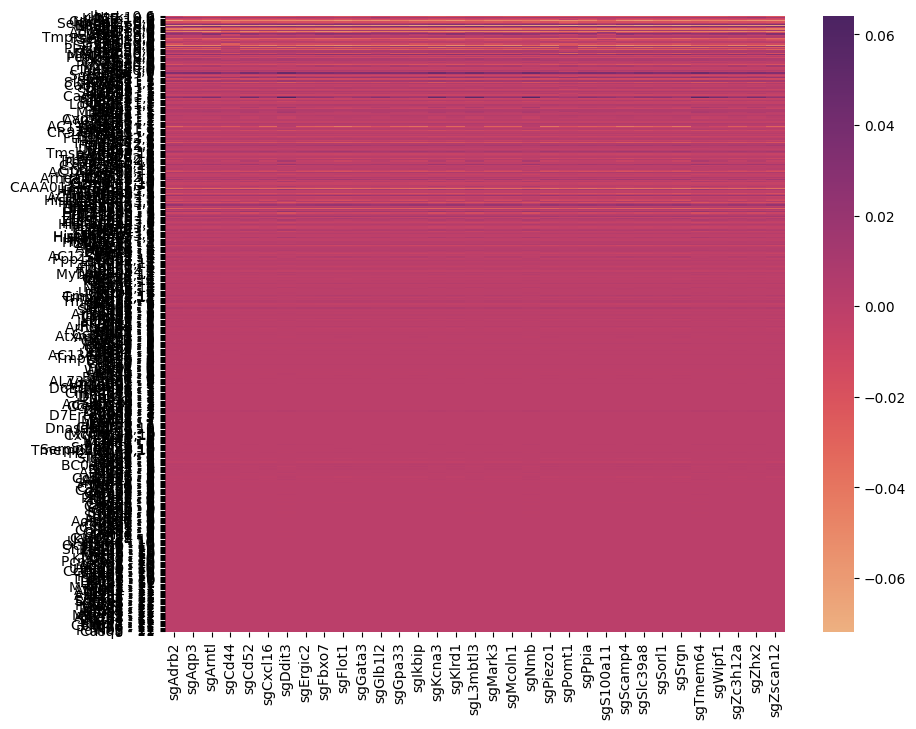

In [274]:
fig, ax = plt.subplots(figsize=(10, 8))
corr_df = pd.DataFrame(corr_matrix_1[:-1], index=cdata.var_names[:-1], columns=deg)

# interests = []
# for ig, g in enumerate(cdata.var_names[:-1]):
#     t = corr_df.iloc[ig, :].sort_values(ascending=False)
#     interests += [gene for gene in t.index[:10]]
#     t = corr_df.iloc[ig, :].sort_values(ascending=True)
#     interests += [gene for gene in t.index[-10:]]

# interests = np.unique(interests)
# corr_df = corr_df.loc[:, interests]

distance_matrix_gRNA = 1 - corr_df.T.corr()
Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
gRNA_order = leaves_list(Z_gRNA)
distance_matrix_gRNA = 1 - corr_df.corr()
Z_RNA = linkage(distance_matrix_gRNA, method='ward')
RNA_order = leaves_list(Z_RNA)

# corr_df = corr_df.iloc[gRNA_order, RNA_order]

gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.heatmap(corr_df.T, cmap="flare", xticklabels=corr_df.index, yticklabels=[gene + " - " + cluster for gene, cluster in zip(corr_df.columns, gene_clusters)], ax=ax)

In [88]:
# proportion matrix for each gene and cluster
guide_cluster_counts = pd.DataFrame(cdata_2.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata_2.obs["cluster_cellcharter_givenk"].tolist()

guide_total_counts = guide_cluster_counts.sum(axis=0)[:-1]
guide_cluster_proportions = guide_cluster_counts.groupby("cluster").sum()
guide_cluster_proportions = guide_cluster_proportions.div(guide_total_counts, axis=1)
guide_cluster_proportions.index = guide_cluster_proportions.index.astype(int)
guide_cluster_proportions = guide_cluster_proportions.T.reindex(sorted(guide_cluster_proportions.index), axis=1)

sc.tl.rank_genes_groups(fdata_2, groupby="cluster_cellcharter_givenk", method="t-test")
mask = [True if str in deg else False for str in fdata_2.var_names]
clusters = fdata_2.obs["cluster_cellcharter_givenk"]
l2fc_matrix = np.zeros((len(np.unique(clusters)), len(deg)))
for i, vec in enumerate(fdata.uns["rank_genes_groups"]["logfoldchanges"][mask]):
    l2fc_matrix[:, i] = [item for item in vec]

guide_matrix = np.array(guide_cluster_proportions.T)
regr.fit(y=guide_matrix, X=l2fc_matrix)
corr_matrix_2 = regr.coef_

In [89]:
# proportion matrix for each gene and cluster
guide_cluster_counts = pd.DataFrame(cdata_3.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata_3.obs["cluster_cellcharter_givenk"].tolist()

guide_total_counts = guide_cluster_counts.sum(axis=0)[:-1]
guide_cluster_proportions = guide_cluster_counts.groupby("cluster").sum()
guide_cluster_proportions = guide_cluster_proportions.div(guide_total_counts, axis=1)
guide_cluster_proportions.index = guide_cluster_proportions.index.astype(int)
guide_cluster_proportions = guide_cluster_proportions.T.reindex(sorted(guide_cluster_proportions.index), axis=1)

sc.tl.rank_genes_groups(fdata_3, groupby="cluster_cellcharter_givenk", method="t-test")
mask = [True if str in deg else False for str in fdata_3.var_names]
clusters = fdata_3.obs["cluster_cellcharter_givenk"]
l2fc_matrix = np.zeros((len(np.unique(clusters)), len(deg)))
for i, vec in enumerate(fdata.uns["rank_genes_groups"]["logfoldchanges"][mask]):
    l2fc_matrix[:, i] = [item for item in vec]

guide_matrix = np.array(guide_cluster_proportions.T)
regr.fit(y=guide_matrix, X=l2fc_matrix)
corr_matrix_3 = regr.coef_

In [94]:
sig_genes_t2to1 = {}
sig_genes_t3to2 = {}
for idx, gene_name in enumerate(cdata.var_names):
    beta_sheat = np.array([corr_matrix_1[idx, :], corr_matrix_2[idx, :], corr_matrix_3[idx, :]]).reshape((3, len(deg))).T
    t2to1 = beta_sheat[:, 1] - beta_sheat[:, 0]
    t3to2 = beta_sheat[:, 2] - beta_sheat[:, 1]

    sig_genes_1 = {}
    z_scores = (t2to1 - np.mean(t2to1)) / np.std(t2to1)
    sig_indices = np.where(z_scores > 0.66)[0]
    sig_genes_t2to1[gene_name] = [deg[i] for i in sig_indices]

    sig_genes_2 = {}
    z_scores = (t3to2 - np.mean(t3to2)) / np.std(t3to2)
    sig_indices = np.where(z_scores > 0.66)[0]
    sig_genes_t3to2[gene_name] = [deg[i] for i in sig_indices]

In [96]:
sig_genes_t2to1 = {}
sig_genes_t3to2 = {}
for idx, gene_name in enumerate(cdata.var_names):
    beta_sheat = np.array([corr_matrix_1[idx, :], corr_matrix_2[idx, :], corr_matrix_3[idx, :]]).reshape((3, len(deg))).T
    t2to1 = beta_sheat[:, 1] - beta_sheat[:, 0]
    t3to2 = beta_sheat[:, 2] - beta_sheat[:, 1]

    sig_genes_1 = {}
    z_scores = (t2to1 - np.mean(t2to1)) / np.std(t2to1)
    sig_indices = np.where(z_scores < -0.66)[0]
    sig_genes_t2to1[gene_name] = [deg[i] for i in sig_indices]

    sig_genes_2 = {}
    z_scores = (t3to2 - np.mean(t3to2)) / np.std(t3to2)
    sig_indices = np.where(z_scores < -0.66)[0]
    sig_genes_t3to2[gene_name] = [deg[i] for i in sig_indices]

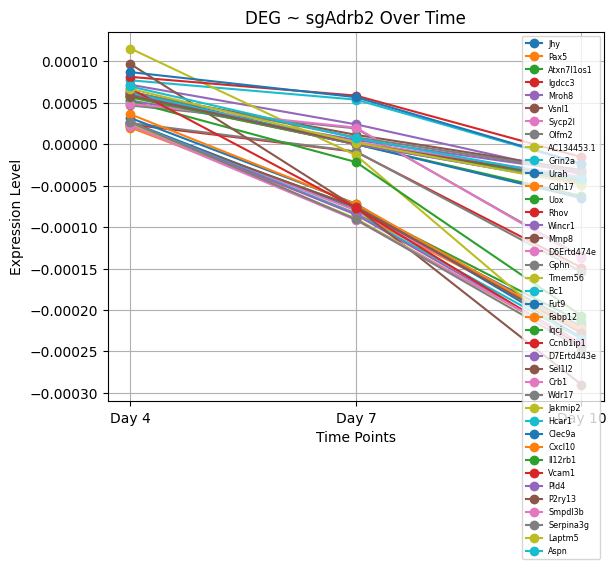

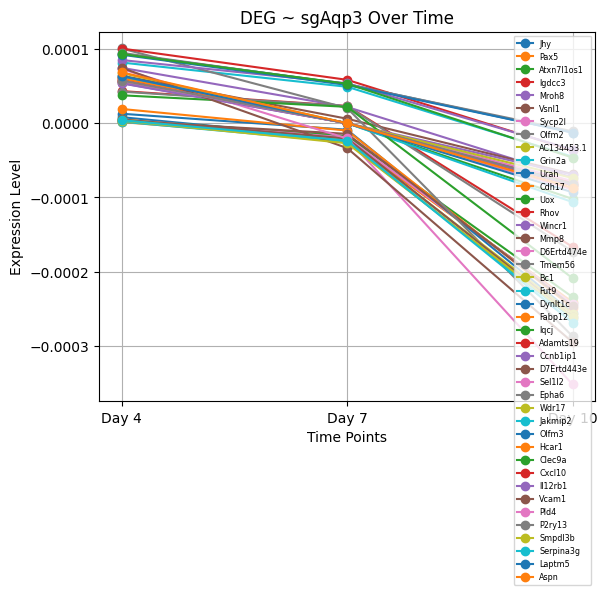

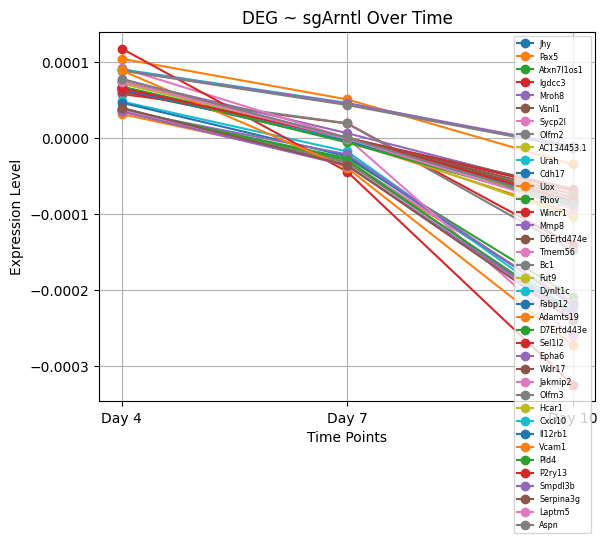

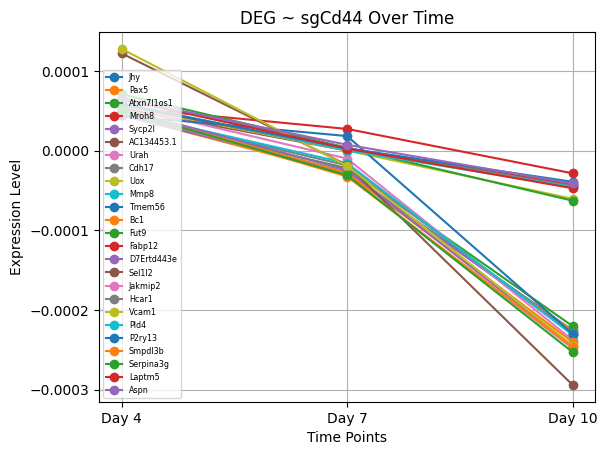

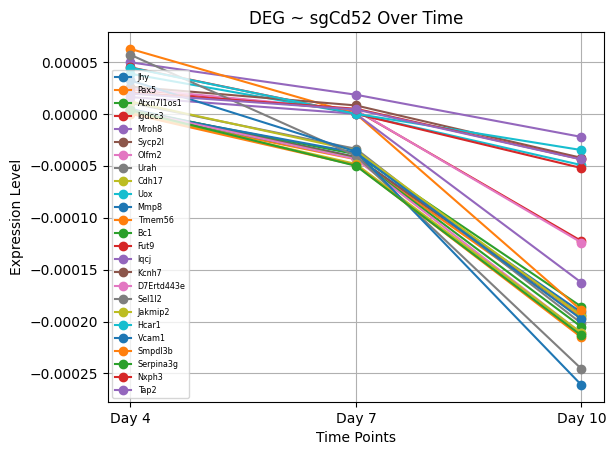

...

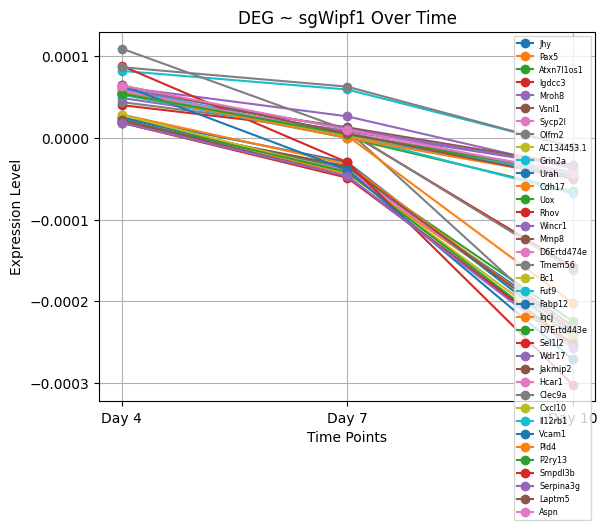

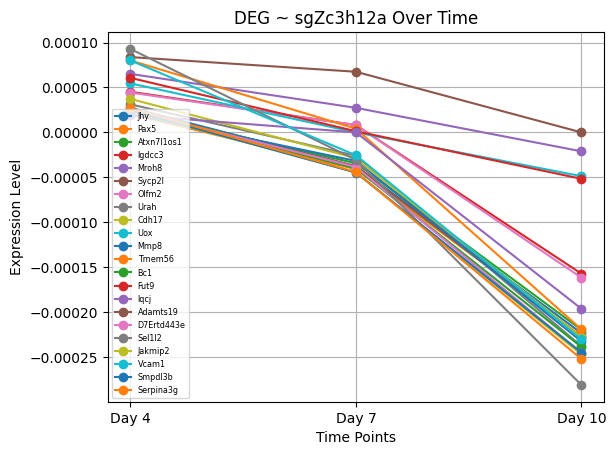

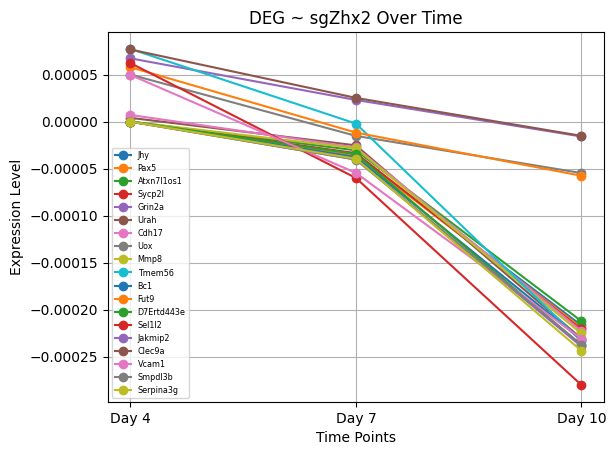

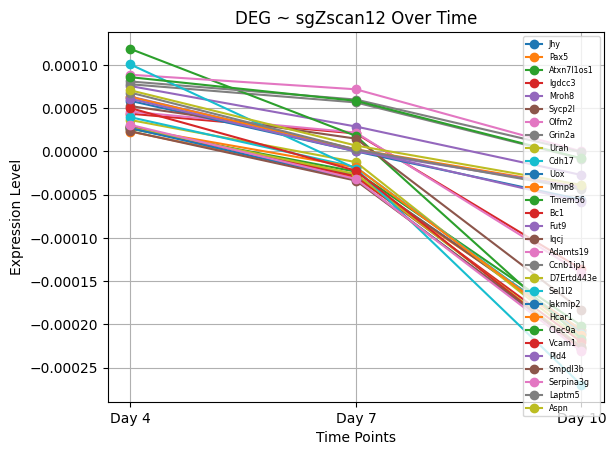

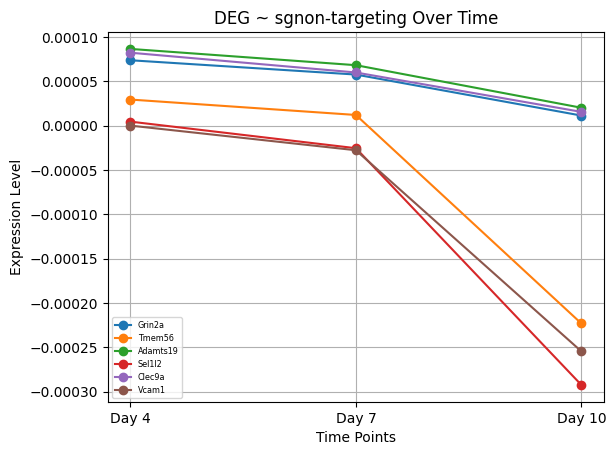

In [97]:
for ig, guide in enumerate(cdata.var_names):
    common_gene = [idx for idx, gene in enumerate(deg) if gene in sig_genes_t2to1[guide] and gene in sig_genes_t3to2[guide]]
    
    time_points = ["Day 4", "Day 7", "Day 10"]
    beta_sheat = np.array([corr_matrix_1[ig, :], corr_matrix_2[ig, :], corr_matrix_3[ig, :]]).reshape((3, len(deg))).T
    plt.plot(time_points, beta_sheat[common_gene].T, marker='o', label=[deg[i] for i in common_gene])

    plt.xlabel('Time Points')
    plt.ylabel('Expression Level')
    plt.title(f'DEG ~ {guide} Over Time')
    plt.grid(True)
    plt.legend(loc="best", fontsize="xx-small")
    plt.show()